In [2]:
import pandas as pd
import os
import scipy.stats
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [4]:
plt.rcParams["font.family"] = "Arial"   # set font to Times New Roman
plt.rcParams["figure.dpi"] = 500  


MM_TO_INCH = 1 / 25.4
def set_default_figsize(width_mm, height_mm):
    plt.rcParams['figure.figsize'] = (width_mm * MM_TO_INCH,
                                      height_mm * MM_TO_INCH)
    
# example
set_default_figsize(90, 80)

- let's make bencmark metrics
  * when model consistently predicted mean of the observed data

In [67]:
ydf= pd.read_csv ("Data/All_reported_data.csv")

bad_fields = pd.read_csv("Data/bad_fields.csv")
ydf = ydf.merge(bad_fields, on=["Year", "FieldID"], how="left", indicator=True)
ydff = ydf[ydf["_merge"] == "left_only"].drop(columns=["_merge"])

yield_df = ydff[["Reported_Yield"]].dropna()
yield_df["yld_mean"] = yield_df["Reported_Yield"].mean()

irrig_df = ydff[["Reported_Irrigation"]].dropna()
irrig_df["irrig_mean"] = irrig_df["Reported_Irrigation"].mean()
irrig_df

,Reported_Irrigation,irrig_mean
0,300.984585,348.514634
1,297.575357,348.514634
2,369.860074,348.514634
4,342.563728,348.514634
5,286.767030,348.514634
...,...,...
94,288.890049,348.514634
95,279.738151,348.514634
96,331.420370,348.514634
97,342.272578,348.514634


In [10]:
def pbias(predicted, observed):
    return 100.0 * np.sum(predicted - observed) / np.sum(observed)

# Normalized MAE
def nmae(predicted, observed):
    return 100.0 * mean_absolute_error(observed, predicted) / np.mean(observed)

# Wrapper to calculate all metrics
def calc_metrics(predicted, observed):
    return {
        "PBIAS": pbias(predicted, observed),
        "NMAE": nmae(predicted, observed),
        "RMSE": np.sqrt(mean_squared_error(observed, predicted)),
        "R2": r2_score(observed, predicted)
    }



In [11]:

observed_yield = yield_df["Reported_Yield"].values
predicted_yield = yield_df["yld_mean"].values

yield_metrics = calc_metrics(predicted_yield, observed_yield)

# --- irrigation metrics (dropping NaNs) ---

observed_irrig = irrig_df["Reported_Irrigation"].values
predicted_irrig = irrig_df["irrig_mean"].values

irrig_metrics = calc_metrics(predicted_irrig, observed_irrig)

print("Yield metrics:", yield_metrics)
print("Irrigation metrics:", irrig_metrics)

Yield metrics: {'PBIAS': -1.4505168416263594e-14, 'NMAE': 18.65024684511825, 'RMSE': 2.716969539218255, 'R2': 0.0}
Irrigation metrics: {'PBIAS': 1.5473775432491838e-14, 'NMAE': 18.976243341591786, 'RMSE': 82.4770416131328, 'R2': 0.0}


## let's compare

In [10]:
df =pd.read_excel("Data/model_performance.xlsx").round(1)
# df['Model'] = df['Model'].replace('NAGA_II Calibrated', 'NSGA-II Calibrated')
df = df[(df['Metric'] != 'R2') & (df['Metric'] != 'RMSE [t/ha]') ] 
df


,Metric,Yield,Irrigation,Model,dftype
1,PBIAS,-3.3,-1.2,AquaCrop-OSpy Balanced,Test Set
2,NMAE,18.6,16.4,AquaCrop-OSpy Balanced,Test Set
5,PBIAS,-0.4,-0.0,XGBoost Five-Fold,Test Set
6,NMAE,11.3,13.4,XGBoost Five-Fold,Test Set
8,PBIAS,-0.8,1.9,XGBoost Holdout Year,NaN
9,NMAE,12.3,14.0,XGBoost Holdout Year,NaN
11,PBIAS,0.0,0.0,Benchmark,NaN
12,NMAE,18.6,19.0,Benchmark,NaN


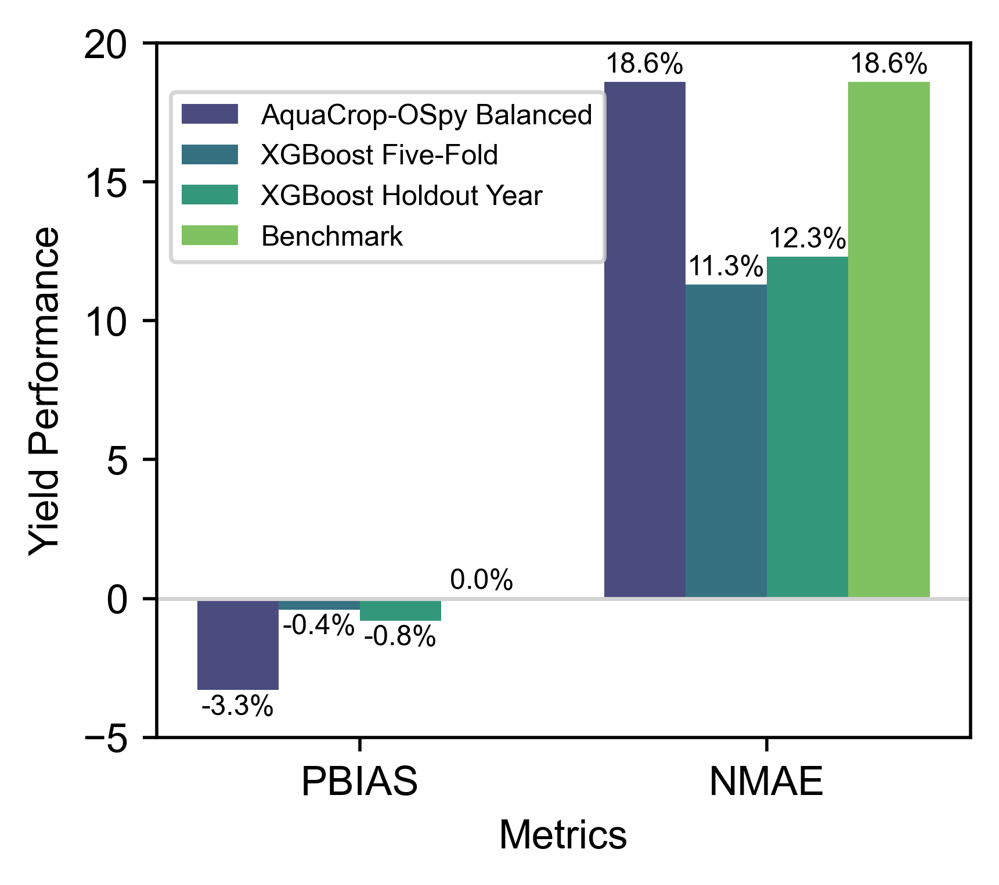

In [11]:


fontsize = 10

# Create the bar plot
ax = sns.barplot(
    data=df,
    x="Metric", y="Yield", hue="Model", palette="viridis"
)

# Loop through bars and data together
for p, (_, row) in zip(ax.patches, df.iterrows()):
    value = p.get_height()
    metric = row['Metric']

    # Format based on metric type
    if metric in ['PBIAS', 'NMAE']:
        formatted_value = f'{value:.1f}%'
    else:
        formatted_value = f'{value:.1f}'

    # Determine text position based on sign of bar height
    if value >= 0:
        y_offset = 1
        va = 'bottom'
    else:
        y_offset = -1
        va = 'top'

    # Annotate
    ax.annotate(
        formatted_value,
        (p.get_x() + p.get_width() / 2., value),
        ha='center', va=va,
        fontsize=7, color='black',
        xytext=(0, y_offset), textcoords='offset points'
    )
    

plt.axhline(0, color="lightgrey", linewidth=1)  # horizontal line
plt.xlabel("Metrics", fontsize=fontsize)
plt.ylabel("Yield Performance", fontsize=fontsize)
plt.legend(
    fontsize=7,
    title_fontsize=9,
    markerscale=0.8,
    loc='upper left',
    bbox_to_anchor=(0, 0.95)   # move down a little (1.0 is top)
)
plt.ylim(-5,20)

# === Save figure ===
save_folder = "other_2figs"
os.makedirs(save_folder, exist_ok=True)
save_path = os.path.join(save_folder, "yld_comp.png")

plt.tight_layout()
plt.savefig(save_path, dpi=500, bbox_inches='tight')   # <-- saves the image
plt.show()

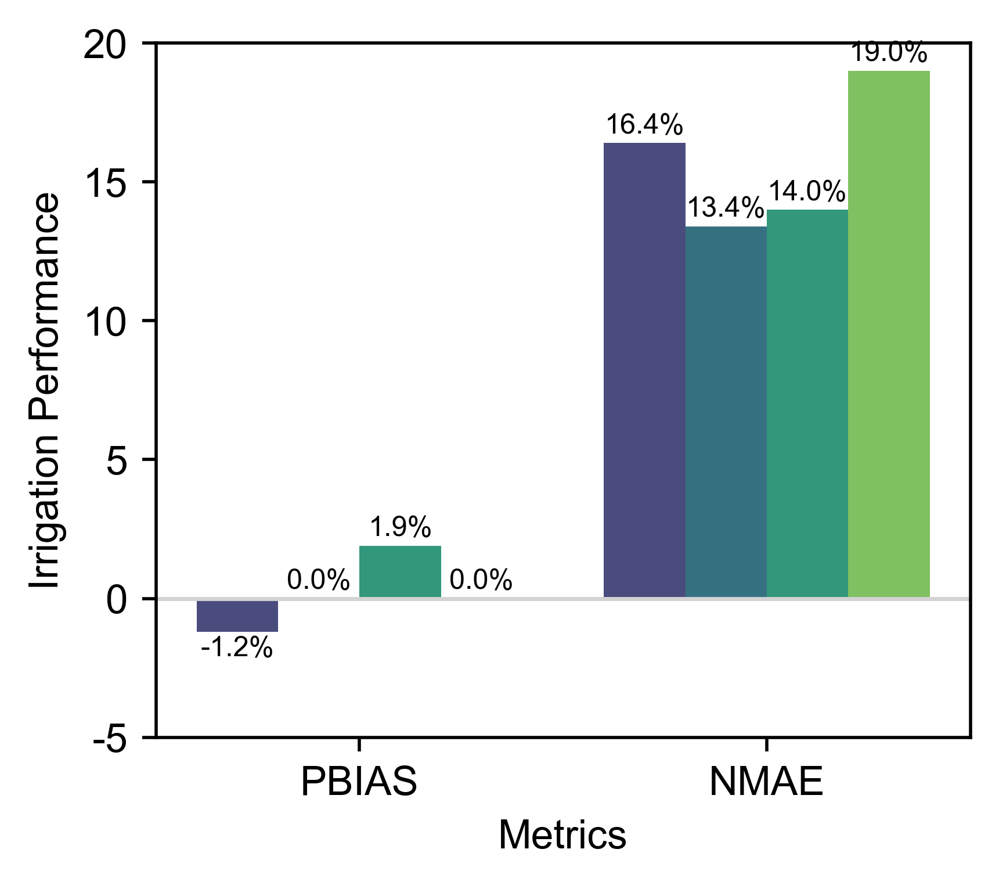

In [12]:


# df['Metric'] = df['Metric'].replace('RMSE [t/ha]', 'RMSE [mm]')
ax = sns.barplot(data =df, x = "Metric",y = "Irrigation", hue ="Model", palette="viridis")

# Loop through bars and data together
for p, (_, row) in zip(ax.patches, df.iterrows()):
    value = p.get_height()
    metric = row['Metric']

    # Format based on metric type
    if metric in ['PBIAS', 'NMAE']:
        formatted_value = f'{value:.1f}%'
    else:
        formatted_value = f'{value:.1f}'

    # Determine text position based on sign of bar height
    if value >= 0:
        y_offset = 1
        va = 'bottom'
    else:
        y_offset = -1
        va = 'top'

    # Annotate
    ax.annotate(
        formatted_value,
        (p.get_x() + p.get_width() / 2., value),
        ha='center', va=va,
        fontsize=7, color='black',
        xytext=(0, y_offset), textcoords='offset points'
    )


plt.axhline(0, color="lightgrey", linewidth=1)  # horizontal line
plt.xlabel("Metrics", fontsize = fontsize)
plt.ylim(-5,20)
plt.ylabel("Irrigation Performance", fontsize = fontsize)

import matplotlib.ticker as mticker
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))

# plt.legend(fontsize=7, title_fontsize=9, markerscale=0.8)
plt.legend().remove()

# === Save figure ===
save_folder = "other_2figs"
os.makedirs(save_folder, exist_ok=True)
save_path = os.path.join(save_folder, "irrig_comp.png")

plt.tight_layout()
plt.savefig(save_path, dpi=500, bbox_inches='tight')   # <-- saves the image
plt.show()

## Spatiao-temporal variation of metrics

In [5]:
# nsgayldyr = pd.read_csv("Data/yr_df_yield.csv") #yld_optimized
# nsgayldfid = pd.read_csv("Data/fiddf_yield.csv")

nsgayldyr = pd.read_csv("Data/yr_df_yield_balncd.csv")
nsgayldfid = pd.read_csv("Data/fiddf_yield_balncd.csv")

bench_yr = pd.read_csv("Data/yr_df_yield_bench.csv")
bench_fid = pd.read_csv("Data/fiddf_yield_bench.csv")

hld_yr = pd.read_csv("Data/hldyr_yield.csv")
hld_fid = pd.read_csv("Data/hlfid_yield.csv")

cv5_yr = pd.read_csv("Data/cv5yr_yield.csv")
cv5_fid = pd.read_csv("Data/cv5fid_yield.csv")


cv5_yr

,Unnamed: 0,Year,Model,Metric,Yield
0,0,2008,XGBoost Five Random CV,RMSE,1.527104
1,1,2008,XGBoost Five Random CV,PBIAS,-2.884693
2,2,2008,XGBoost Five Random CV,NMAE,11.290748
3,3,2009,XGBoost Five Random CV,RMSE,1.982438
4,4,2009,XGBoost Five Random CV,PBIAS,4.816682
5,5,2009,XGBoost Five Random CV,NMAE,16.104777
6,6,2010,XGBoost Five Random CV,RMSE,0.889369
7,7,2010,XGBoost Five Random CV,PBIAS,2.256296
8,8,2010,XGBoost Five Random CV,NMAE,7.633948
9,9,2011,XGBoost Five Random CV,RMSE,0.644496


In [6]:
# yld by field data
yld_fid = pd.concat ([nsgayldfid, cv5_fid,hld_fid, bench_fid ])
yld_fid ["Metric"] = yld_fid ["Metric"].replace({
    "RMSE": "RMSE (t/ha)",
    "PBIAS": "PBIAS (%)",
    "NMAE": "NMAE (%)"
})


#yld by data
yld_yr = pd.concat([nsgayldyr,cv5_yr,hld_yr,bench_yr])

yld_yr ["Metric"] = yld_yr ["Metric"].replace({
    "RMSE": "RMSE (t/ha)",
    "PBIAS": "PBIAS (%)",
    "NMAE": "NMAE (%)"
})



In [7]:
yld_fid.columns

Index(['Unnamed: 0', 'FieldID', 'Model', 'Metric', 'Yield'], dtype='object')

In [8]:
yld_yr["Model"] = yld_yr["Model"].replace({
    "XGBoost Five Random CV": "XGBoost Five-Fold",
    "XGBoost Leave-One-Year-Out": "XGBoost Holdout Year"
})
yld_fid

,Unnamed: 0,FieldID,Model,Metric,Yield
0,0,NB1,AquaCrop-OSPy Balanced,RMSE (t/ha),2.246841
1,1,NB1,AquaCrop-OSPy Balanced,PBIAS (%),-2.859084
2,2,NB1,AquaCrop-OSPy Balanced,NMAE (%),16.368174
3,3,NC1,AquaCrop-OSPy Balanced,RMSE (t/ha),5.302763
4,4,NC1,AquaCrop-OSPy Balanced,PBIAS (%),-31.284085
...,...,...,...,...,...
25,25,NW6,Benchmark,PBIAS (%),-17.521361
26,26,NW6,Benchmark,NMAE (%),17.521361
27,27,NW7,Benchmark,RMSE (t/ha),2.827239
28,28,NW7,Benchmark,PBIAS (%),-11.773076


In [13]:
yld_fid["Model"] = yld_fid["Model"].replace({
    "XGBoost Five Random CV": "XGBoost Five-Fold",
    "XGBoost Leave-One-Field-Out ": "XGBoost Holdout Field"
})
yld_fid

,Unnamed: 0,FieldID,Model,Metric,Yield
0,0,NB1,AquaCrop-OSPy Balanced,RMSE (t/ha),2.246841
1,1,NB1,AquaCrop-OSPy Balanced,PBIAS (%),-2.859084
2,2,NB1,AquaCrop-OSPy Balanced,NMAE (%),16.368174
3,3,NC1,AquaCrop-OSPy Balanced,RMSE (t/ha),5.302763
4,4,NC1,AquaCrop-OSPy Balanced,PBIAS (%),-31.284085
...,...,...,...,...,...
25,25,NW6,Benchmark,PBIAS (%),-17.521361
26,26,NW6,Benchmark,NMAE (%),17.521361
27,27,NW7,Benchmark,RMSE (t/ha),2.827239
28,28,NW7,Benchmark,PBIAS (%),-11.773076


In [12]:
yld_fid["Model"].unique()

array(['AquaCrop-OSPy Balanced', 'XGBoost Five-Fold',
       'XGBoost Leave-One-Field-Out ', 'Benchmark'], dtype=object)

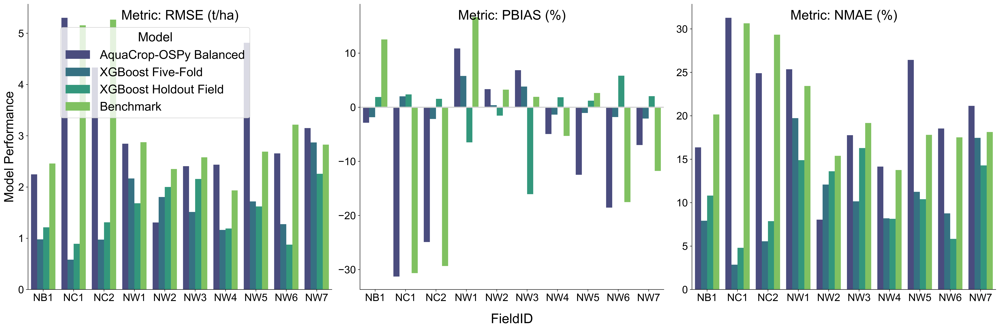

In [14]:

# Create the FacetGrid
g = sns.FacetGrid(yld_fid, col="Metric", height=8, aspect=1, sharey=False)
g.map_dataframe(sns.barplot, x="FieldID", y="Yield", hue="Model", palette="viridis")

# Remove default titles and place custom ones inside each subplot
g.set_titles("")
for ax, title in zip(g.axes.flat, g.col_names):
    ax.text(0.5, 0.98, f"Metric: {title}",
            fontsize=23,
            ha='center', va='top',
            transform=ax.transAxes)

# Axis labels and tick formatting
for i, ax in enumerate(g.axes.flat):

    # --- Only center plot gets an xlabel ---
    if i == 1:         # middle subplot
        ax.set_xlabel("FieldID", fontsize=23, labelpad=18)
        ax.axhline(0, color="lightgrey", linewidth=2)
        
    else:
        ax.set_xlabel("")

    # --- Only first subplot keeps ylabel ---
    if i == 0:
        ax.set_ylabel("Model Performance", fontsize=22)
    else:
        ax.set_ylabel("")   # remove ylabel but keep ticks

    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    

# Customize the legend
handles, labels = g.axes.flat[0].get_legend_handles_labels()
g.axes.flat[0].legend(
    handles, labels,
    title="Model",
    loc="upper right",
    bbox_to_anchor=(.75,.94),
    fontsize=21,
    title_fontsize=22
)

# Adjust spacing
plt.tight_layout()

# === Save figure ===
save_folder = "other_2figs"
os.makedirs(save_folder, exist_ok=True)
save_path = os.path.join(save_folder, "yld_spatio.png")

g.fig.savefig(save_path, dpi=500, bbox_inches='tight')

plt.show()


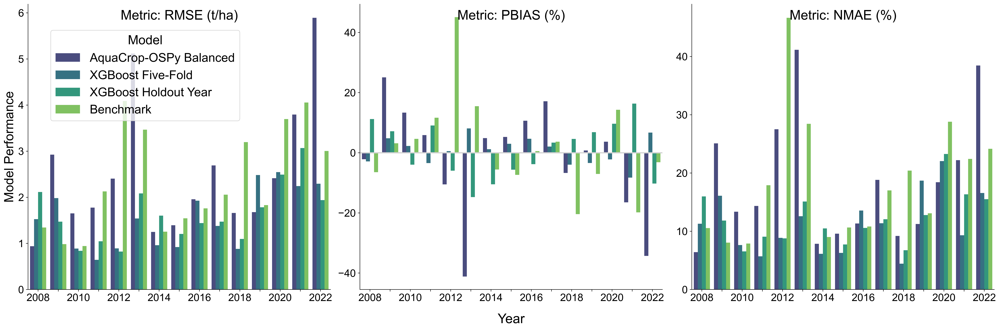

In [11]:

# Treat Year as categorical to avoid aggregation issues
yld_yr["Year"] = yld_yr["Year"].astype(str)

# Create the FacetGrid
g = sns.FacetGrid(yld_yr, col="Metric", height=8, aspect=1, sharey=False)
g.map_dataframe(sns.barplot, x="Year", y="Yield", hue="Model", palette="viridis")

# Remove default titles and place model names inside each plot
g.set_titles("")
for ax, title in zip(g.axes.flat, g.col_names):
    ax.text(0.5, 0.98, f"Metric: {title}",
            fontsize=23, ha='center', va='top',
            transform=ax.transAxes)

# Axis labels and selective x-tick labeling
for i, ax in enumerate(g.axes.flat):
    if i == 1: 
        ax.set_xlabel("Year", fontsize=23, labelpad=18)
        ax.axhline(0, color="lightgrey", linewidth=2)
    else:
        ax.set_xlabel("")
    if i == 0:
        ax.set_ylabel("Model Performance", fontsize=22)
    else:
        ax.set_ylabel("")

    # Keep all ticks, label only even years
    xticks = ax.get_xticks()
    xticklabels = ax.get_xticklabels()
    new_labels = []
    for label in xticklabels:
        text = label.get_text()
        if text.strip().isdigit() and int(text) % 2 == 0:
            new_labels.append(text)
        else:
            new_labels.append("")
    ax.set_xticklabels(new_labels, fontsize=18)
    ax.tick_params(axis='y', labelsize=18)
    
plt.axhline(0, color="lightgrey", linewidth=1)  # horizontal line
# Customize the legend
handles, labels = g.axes.flat[0].get_legend_handles_labels()
g.axes.flat[0].legend(
    handles, labels,
    title="Model",
    loc="lower right",
    bbox_to_anchor=(.72, .57),
    fontsize=21,
    title_fontsize=22
)
# plt.legend().remove()
# Final layout
plt.tight_layout()

# === Save figure ===
save_folder = "other_2figs"
os.makedirs(save_folder, exist_ok=True)
save_path = os.path.join(save_folder, "yld_temp.png")

g.fig.savefig(save_path, dpi=500, bbox_inches='tight')

plt.show()


## For irrigation



In [26]:
# aqyr = pd.read_csv("Data/yr_df_irig.csv")
# aqfid = pd.read_csv("Data/fiddf_irig.csv")

aqyr = pd.read_csv("Data/yr_df_irig_balncd.csv")
aqfid = pd.read_csv("Data/fiddf_irig_balncd.csv")

bench_irrig_yr = pd.read_csv("Data/yr_df_irig_bench.csv")
bench_irrig_fid = pd.read_csv("Data/fiddf_irig_bench.csv")

cv5_yr_irri = pd.read_csv("Data/cv5yr_irrig.csv")
cv5_fid_irri = pd.read_csv("Data/cv5fid_irrig.csv")

hld_yr_irri = pd.read_csv("Data/irig_yr.csv")
hld_fid_irri = pd.read_csv("Data/irig_fid.csv")


In [27]:
irr_yr = pd.concat ([aqyr,cv5_yr_irri,hld_yr_irri,bench_irrig_yr ])
irr_yr ["Metric"] =irr_yr ["Metric"].replace({
    "RMSE": "RMSE (mm)",
    "PBIAS": "PBIAS (%)",
    "NMAE": "NMAE (%)"
})
irr_yr

,Unnamed: 0,Year,Model,Metric,Irrigation
0,21,2015,AquaCrop-OSPy Balanced,RMSE (mm),76.078657
1,22,2015,AquaCrop-OSPy Balanced,PBIAS (%),19.664299
2,23,2015,AquaCrop-OSPy Balanced,NMAE (%),22.520990
3,24,2016,AquaCrop-OSPy Balanced,RMSE (mm),81.546408
4,25,2016,AquaCrop-OSPy Balanced,PBIAS (%),-17.172271
...,...,...,...,...,...
19,19,2021,Benchmark,PBIAS (%),13.653640
20,20,2021,Benchmark,NMAE (%),24.950040
21,21,2022,Benchmark,RMSE (mm),128.260834
22,22,2022,Benchmark,PBIAS (%),-9.770143


In [28]:
irr_fid = pd.concat ([aqfid,cv5_fid_irri,hld_fid_irri,bench_irrig_fid ])
irr_fid ["Metric"] =irr_fid ["Metric"].replace({
    "RMSE": "RMSE (mm)",
    "PBIAS": "PBIAS (%)",
    "NMAE": "NMAE (%)"
})


In [29]:
irr_yr["Model"] = irr_yr["Model"].replace({
    "XGBoost Five Random CV": "XGBoost Five-Fold",
    "XGBoost Leave-One-Year-Out": "XGBoost Holdout Year"
})


In [30]:
irr_fid["Model"] = irr_fid["Model"].replace({
    "XGBoost Five Random CV": "XGBoost Five-Fold",
    "XGBoost Leave-One-Field-Out": "XGBoost Holdout Field"
})


In [31]:
# excluding fids that have only one observation to reduce plot clutter

one_count_field_ids = ['WC6','WC24','WC4','WC3','WC25','WC16','WC23','WC21','WC2', 'WC19','WC11', 'NW6','WC9']
irr_fid = irr_fid[~irr_fid['FieldID'].isin(one_count_field_ids)]
irr_fid

,Unnamed: 0,FieldID,Model,Metric,Irrigation
0,0,NB1,AquaCrop-OSPy Balanced,RMSE (mm),79.815265
1,1,NB1,AquaCrop-OSPy Balanced,PBIAS (%),6.675445
2,2,NB1,AquaCrop-OSPy Balanced,NMAE (%),17.740382
3,3,NC1,AquaCrop-OSPy Balanced,RMSE (mm),27.219405
4,4,NC1,AquaCrop-OSPy Balanced,PBIAS (%),-4.072905
...,...,...,...,...,...
70,70,WC5,Benchmark,PBIAS (%),-8.434778
71,71,WC5,Benchmark,NMAE (%),8.434778
75,75,WC8,Benchmark,RMSE (mm),148.332177
76,76,WC8,Benchmark,PBIAS (%),-28.030168


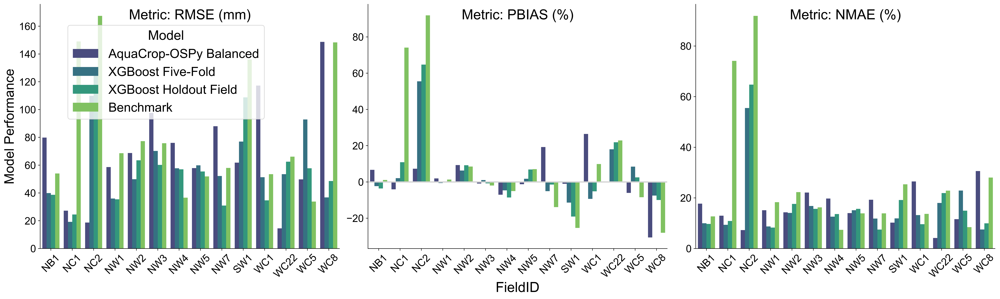

In [32]:
g = sns.FacetGrid(irr_fid, col="Metric", height=7, aspect=1.1, sharey=False)
g.map_dataframe(sns.barplot, x="FieldID", y="Irrigation", hue="Model", palette="viridis")

# Remove default titles and place custom ones inside each subplot
g.set_titles("")
for ax, title in zip(g.axes.flat, g.col_names):
    ax.text(0.5, 0.98, f"Metric: {title}",
            fontsize=23,
            ha='center', va='top',
            transform=ax.transAxes)

# Axis labels and tick formatting
for i, ax in enumerate(g.axes.flat):
    if i == 1:         # middle subplot
        ax.set_xlabel("FieldID", fontsize=23)
        ax.axhline(0, color="lightgrey", linewidth=2)
        
    else:
        ax.set_xlabel("")
    
    if i == 0:
        ax.set_ylabel("Model Performance", fontsize=22)
    else:
        ax.set_ylabel("") 

    ax.tick_params(axis='x', labelsize=17, rotation = 45)
    ax.tick_params(axis='y', labelsize=17)  # ✅ Keeps y-tick numbers

# Customize the legend
handles, labels = g.axes.flat[0].get_legend_handles_labels()
g.axes.flat[0].legend(
    handles, labels,
    title="Model",
    loc="upper right",
    bbox_to_anchor=(.77,.94),
    fontsize=21,
    title_fontsize=22
)

plt.tight_layout()

# === Save figure ===
save_folder = "other_2figs"
os.makedirs(save_folder, exist_ok=True)
save_path = os.path.join(save_folder, "irrig_spatio.png")

g.fig.savefig(save_path, dpi=500, bbox_inches='tight')

plt.show()



In [33]:

# Treat Year as categorical to avoid aggregation issues
irr_yr["Year"] = irr_yr["Year"].astype(str)

# Create the FacetGrid
g = sns.FacetGrid(irr_yr, col="Metric", height=8, aspect=1.1, sharey=False)
g.map_dataframe(sns.barplot, x="Year", y="Irrigation", hue="Model", palette="viridis")

# Remove default titles and place model names inside each plot
g.set_titles("")
for ax, title in zip(g.axes.flat, g.col_names):
    ax.text(0.5, 0.98, f"Metric: {title}",
            fontsize=23, ha='center', va='top',
            transform=ax.transAxes)

# Axis labels and all x-tick labels
for i, ax in enumerate(g.axes.flat):
    if i == 1: 
        ax.set_xlabel("Year", fontsize=23 , labelpad=18)
        ax.axhline(0, color="lightgrey", linewidth=2)
    else:
        ax.set_xlabel("")

    if i == 0:
        ax.set_ylabel("Model Performance", fontsize=22)
    else:
        ax.set_ylabel("")
        
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

    # Optional: ensure all current x-ticks are set
    xticks = ax.get_xticks()
    ax.set_xticks(xticks) 

# Customize the legend
handles, labels = g.axes.flat[0].get_legend_handles_labels()
g.axes.flat[0].legend(
    handles, labels,
    title="Model",
    loc="lower right",
    bbox_to_anchor=(.66, .57),
    fontsize=21,
    title_fontsize=22
)

# plt.legend().remove()
# Final layout
plt.tight_layout()

# === Save figure ===
save_folder = "other_2figs"
os.makedirs(save_folder, exist_ok=True)
save_path = os.path.join(save_folder, "irrig_temp.png")

g.fig.savefig(save_path, dpi=500, bbox_inches='tight')

plt.show()


### Relationship with annual precip

In [32]:
pdf = pd.read_csv('Data/Updated_all_fieldsclimate.csv')
pdf.rename(columns={"fid": "FieldID"}, inplace =True)
pdf["Date"] =pdf.Date.str[:8]
pdf["Date"]= pd.to_datetime(pdf["Date"])
pdf['Year'] = pdf['Date'].dt.year
# excluding bad fields
bad_fields = pd.read_csv("Data/bad_fields.csv")
pdf = pdf.merge(bad_fields, on=["Year", "FieldID"], how="left", indicator=True)
pdf = pdf[pdf["_merge"] == "left_only"].drop(columns=["_merge"])
pdf = pdf[(pdf["Date"] >= '2008-01-01') & (pdf["Date"] <= '2022-12-31')]
pdf = pdf[(pdf['Date'].dt.month >= 1) & (pdf['Date'].dt.month <= 9)] #in the xgboost we used mont 1-9
Precip_sum =pdf.groupby(["Year", "FieldID"])["Precipitation"].sum().reset_index()
Precip_sum = Precip_sum.groupby("Year")["Precipitation"].mean().reset_index()
Precip_sum.rename(columns={'Precipitation': 'Precip_sum'}, inplace=True)
Precip_sum

,Year,Precip_sum
0,2008,361.833548
1,2009,455.722905
2,2010,498.167825
3,2011,350.793594
4,2012,275.818213
5,2013,410.183654
6,2014,470.013034
7,2015,563.829858
8,2016,565.444512
9,2017,618.484813


* let's see data type of precip and yield_yr data frame "Year column"

In [33]:
Precip_sum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Year        15 non-null     int32  
 1   Precip_sum  15 non-null     float64
dtypes: float64(1), int32(1)
memory usage: 312.0 bytes


In [34]:
yld_yr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180 entries, 0 to 44
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  180 non-null    int64  
 1   Year        180 non-null    int64  
 2   Model       180 non-null    object 
 3   Metric      180 non-null    object 
 4   Yield       180 non-null    float64
dtypes: float64(1), int64(2), object(2)
memory usage: 8.4+ KB


In [35]:
yld_yr["Year"] = yld_yr["Year"].astype(int)

In [36]:
precip_yld = yld_yr.merge(Precip_sum, on="Year", how="inner")
precip_yld

,Unnamed: 0,Year,Model,Metric,Yield,Precip_sum
0,0,2008,AquaCrop-OSPy Balanced,RMSE (t/ha),0.938362,361.833548
1,1,2008,AquaCrop-OSPy Balanced,PBIAS (%),-2.163032,361.833548
2,2,2008,AquaCrop-OSPy Balanced,NMAE (%),6.420486,361.833548
3,0,2008,XGBoost Five Random CV,RMSE (t/ha),1.527104,361.833548
4,1,2008,XGBoost Five Random CV,PBIAS (%),-2.884693,361.833548
...,...,...,...,...,...,...
175,43,2022,XGBoost Leave-One-Year-Out,PBIAS (%),-10.221533,263.374805
176,44,2022,XGBoost Leave-One-Year-Out,NMAE (%),15.510234,263.374805
177,42,2022,Benchmark,RMSE (t/ha),3.004032,263.374805
178,43,2022,Benchmark,PBIAS (%),-3.149893,263.374805


In [37]:
# Set up FacetGrid: rows = metrics, columns = models
g = sns.FacetGrid(
    precip_yld,
    row="Metric",
    col="Model",
    height=4,
    aspect=1.2,
    sharex=True,
    sharey=False
)

# Plot points and trend line
g.map_dataframe(sns.scatterplot, x="Precip_sum", y="Yield")
g.map_dataframe(sns.regplot, x="Precip_sum", y="Yield", scatter=False, ci=None, line_kws={"color": "red"})

# Remove all default titles
# Remove default titles
for row in g.axes:
    for ax in row:
        ax.set_title("")

# Add model names as text in the top-middle of each subplot
for ax, model_name in zip(g.axes[0], g.col_names):
    ax.text(
        0.5, .9, model_name,
        fontsize=13,
        ha='center',
#         va='bottom',
        transform=ax.transAxes,
#         fontweight='bold'
    )

# Set axis labels
g.set_axis_labels("Precipitation (mm)", fontsize=14)

# Manually set y-axis labels (metric names) for leftmost plots
for ax, metric in zip(g.axes[:, 0], g.row_names):
    ax.set_ylabel(metric, fontsize=12)

# Remove duplicate y-axis labels on other columns
for i in range(len(g.row_names)):
    for j in range(1, len(g.col_names)):
        g.axes[i, j].set_ylabel("")

from scipy.stats import pearsonr

for (metric, model), data_subset in precip_yld.groupby(["Metric", "Model"]):
    try:
        r, p = pearsonr(data_subset["Yield"], data_subset["Precip_sum"])
        
        # Get the corresponding subplot axis
        row_idx = g.row_names.index(metric)
        col_idx = g.col_names.index(model)
        ax = g.axes[row_idx, col_idx]
        
        # Format r with or without asterisk based on p-value
        r_label = f"r = {r:.2f}" + ("*" if p < 0.05 else "")
        
        # Plot the text
        ax.text(
            0.05, 0.85, r_label,
            transform=ax.transAxes,
            fontsize=14,
            ha="left",
            va="top"
        )
    except Exception:
        continue 
plt.show()


plt.show()


In [38]:
# Irrigation part

irr_yr["Year"] =irr_yr["Year"].astype(int)
precip_irrig = irr_yr.merge (Precip_sum)
precip_irrig

,Unnamed: 0,Year,Model,Metric,Irrigation,Precip_sum
0,21,2015,AquaCrop-OSPy Balanced,RMSE (mm),76.078657,563.829858
1,22,2015,AquaCrop-OSPy Balanced,PBIAS (%),19.664299,563.829858
2,23,2015,AquaCrop-OSPy Balanced,NMAE (%),22.520990,563.829858
3,0,2015,XGBoost Five Random CV,RMSE (mm),40.577224,563.829858
4,1,2015,XGBoost Five Random CV,PBIAS (%),2.982090,563.829858
...,...,...,...,...,...,...
91,22,2022,XGBoost Leave-One-Year-Out,PBIAS (%),5.106293,263.374805
92,23,2022,XGBoost Leave-One-Year-Out,NMAE (%),15.610686,263.374805
93,21,2022,Benchmark,RMSE (mm),128.260834,263.374805
94,22,2022,Benchmark,PBIAS (%),-9.770143,263.374805


In [39]:
# Set up FacetGrid: rows = metrics, columns = models
g = sns.FacetGrid(
    precip_irrig,
    row="Metric",
    col="Model",
    height=4,
    aspect=1.2,
    sharex=True,
    sharey=False
)

# Plot points and trend line
g.map_dataframe(sns.scatterplot, x="Precip_sum", y="Irrigation")
g.map_dataframe(sns.regplot, x="Precip_sum", y="Irrigation", scatter=False, ci=None, line_kws={"color": "red"})

# Remove all default titles
# Remove default titles
for row in g.axes:
    for ax in row:
        ax.set_title("")

# Add model names as text in the top-middle of each subplot
for ax, model_name in zip(g.axes[0], g.col_names):
    ax.text(
        0.5, .9, model_name,
        fontsize=13,
        ha='center',
#         va='bottom',
        transform=ax.transAxes,
#         fontweight='bold'
    )

# Set axis labels
g.set_axis_labels("Precipitation (mm)", fontsize=14)

# Manually set y-axis labels (metric names) for leftmost plots
for ax, metric in zip(g.axes[:, 0], g.row_names):
    ax.set_ylabel(metric, fontsize=14)

# Remove duplicate y-axis labels on other columns
for i in range(len(g.row_names)):
    for j in range(1, len(g.col_names)):
        g.axes[i, j].set_ylabel("")

from scipy.stats import pearsonr

for (metric, model), data_subset in precip_irrig.groupby(["Metric", "Model"]):
    try:
        r, p = pearsonr(data_subset["Irrigation"], data_subset["Precip_sum"])
        
        # Get the corresponding subplot axis
        row_idx = g.row_names.index(metric)
        col_idx = g.col_names.index(model)
        ax = g.axes[row_idx, col_idx]
        
        # Format r with or without asterisk based on p-value
        r_label = f"r = {r:.2f}" + ("*" if p < 0.05 else "")
        
        # Plot the text
        ax.text(
            0.05, 0.85, r_label,
            transform=ax.transAxes,
            fontsize=14,
            ha="left",
            va="top"
        )
    except Exception:
        continue  # skip if there's an error like NaNs or not enough data


plt.show()


plt.show()


## merging plots

In [35]:
import os
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def merge_images(
    image_paths,
    output_name="merged.png",
    rows=2,
    cols=2,
    fig_width_in=6.5,
    dpi=500,
    filenames=None,
    show=True,
    add_labels=True,
    label_color="Black",
    label_background="White",
    label_font_size=None
):
    """
    Merge PNG images in a grid layout with fixed final width.
    Keeps original function signature.

    Parameters
    ----------
    image_paths : str or list
        Folder name OR list of image paths
    output_name : str
        Name of output merged image
    rows, cols : int
        Grid layout
    fig_width_in : float
        Final merged figure width (inches)
    dpi : int
        Resolution of output
    filenames : list or None
        If provided, load only these files from the folder
    show : bool
        Display inside notebook
    add_labels : bool
        Whether to add a) b) c) labels to each image
    label_color : str
        Color of the label text (e.g., "white", "black", "#FFFFFF")
    label_background : str or None
        Color of label background, None for transparent
    label_font_size : int or None
        Font size for labels, None for automatic scaling
    """

    # --- Load paths ---
    if isinstance(image_paths, str):
        folder = image_paths
        if filenames:
            paths = [os.path.join(folder, f) for f in filenames]
        else:
            paths = sorted([
                os.path.join(folder, f)
                for f in os.listdir(folder)
                if f.lower().endswith(".png")
            ])
    else:
        # already a list of paths
        paths = image_paths

    imgs = [Image.open(p) for p in paths]
    n = len(imgs)
    assert rows * cols >= n, "Grid is too small for number of images."

    # --- Add labels to images if requested ---
    if add_labels:
        letter_labels = [f"{chr(97 + i)})" for i in range(n)]  # a), b), c), ...
        labeled_imgs = []
        
        for i, (img, label) in enumerate(zip(imgs, letter_labels)):
            # Convert to RGBA if not already
            if img.mode != "RGBA":
                img = img.convert("RGBA")
            
            # Create a copy to draw on
            img_with_label = img.copy()
            draw = ImageDraw.Draw(img_with_label)
            
            # Determine font size (5% of image height or specified)
            if label_font_size is None:
                font_size = max(20, int(img.height * 0.05))
            else:
                font_size = label_font_size
            
            # Try to load a font
            font = None
            # List of fonts to try (common system fonts)
            font_paths = [
                "arial.ttf",
                "Arial.ttf",
                "/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
                "/System/Library/Fonts/Helvetica.ttc",
                "C:/Windows/Fonts/arial.ttf"
            ]
            
            for font_path in font_paths:
                try:
                    font = ImageFont.truetype(font_path, font_size)
                    break
                except:
                    continue
            
            # If no font file found, use PIL's default bitmap font
            if font is None:
                try:
                    # For newer PIL versions
                    font = ImageFont.load_default()
                    # For default font, we need to adjust size differently
                    # We'll use a simpler approach
                    font = ImageFont.load_default()
                    # We'll handle the size differently for default font
                except:
                    # Create a simple default font as fallback
                    pass
            
            # Calculate text size
            if hasattr(font, 'getbbox'):  # Newer PIL
                bbox = font.getbbox(label)
                text_width = bbox[2] - bbox[0]
                text_height = bbox[3] - bbox[1]
            elif hasattr(font, 'getsize'):  # Older PIL
                text_width, text_height = font.getsize(label)
            else:
                # Estimate for default font
                text_width = font_size * len(label) * 0.6
                text_height = font_size
            
            # Add padding around text
            padding = int(font_size * 0.3)
            
            # Draw background if requested
            if label_background:
                # Create background rectangle
                bg_width = int(text_width + 2 * padding)
                bg_height = int(text_height + 2 * padding)
                
                # Draw rectangle
                draw.rectangle(
                    [0, 0, bg_width, bg_height],
                    fill=label_background,
                    outline=None
                )
            
            # Draw text
            if font:
                draw.text(
                    (padding, padding),
                    label,
                    fill=label_color,
                    font=font
                )
            else:
                # Fallback: draw text without specific font
                draw.text(
                    (padding, padding),
                    label,
                    fill=label_color
                )
            
            labeled_imgs.append(img_with_label)
        
        imgs = labeled_imgs

    # --- Standardize height for each image ---
    max_h = max(img.height for img in imgs)
    resized = [
        img.resize(
            (int(img.width * max_h / img.height), max_h),
            Image.Resampling.LANCZOS if hasattr(Image, 'Resampling') else Image.LANCZOS
        )
        for img in imgs
    ]

    cell_w = max(img.width for img in resized)
    cell_h = max(img.height for img in resized)

    # --- Create blank canvas ---
    merged = Image.new("RGB", (cols * cell_w, rows * cell_h), (255, 255, 255))

    # --- Paste images in grid ---
    for idx, img in enumerate(resized):
        r = idx // cols
        c = idx % cols
        # Convert to RGB if necessary
        if img.mode == "RGBA":
            # Create white background
            white_bg = Image.new("RGB", img.size, (255, 255, 255))
            white_bg.paste(img, mask=img.split()[3] if img.mode == "RGBA" else None)
            merged.paste(white_bg, (c * cell_w, r * cell_h))
        else:
            merged.paste(img, (c * cell_w, r * cell_h))

    # --- Resize to fixed figure width ---
    target_px_w = int(fig_width_in * dpi)
    scale = target_px_w / merged.width
    target_px_h = int(merged.height * scale)

    merged = merged.resize((target_px_w, target_px_h), Image.Resampling.LANCZOS if hasattr(Image, 'Resampling') else Image.LANCZOS)

    # --- Save ---
    merged.save(output_name, dpi=(dpi, dpi))

    # --- Display in notebook ---
    if show:
        plt.figure(figsize=(fig_width_in, target_px_h / dpi))
        plt.imshow(merged)
        plt.axis("off")
        plt.show()

    print(f"Saved: {output_name}")


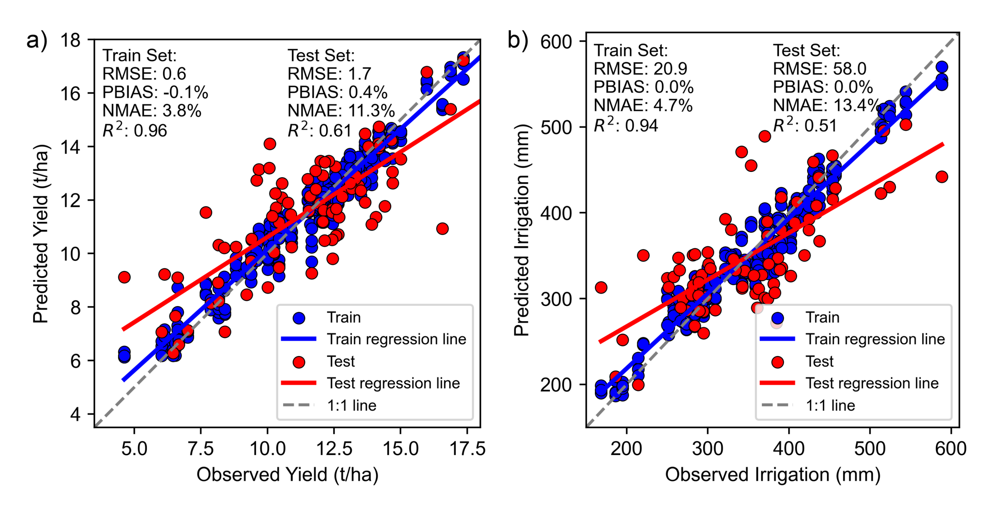

Saved: CV_merged_xgboost.png


In [7]:
# merge_images("other_2figs", output_name="twoCV_side.png", rows=1, cols=2)

merge_images(
   image_paths="other_2figs",
    filenames=["yld_cv.png", "irrig_cv.png"],
    output_name="CV_merged_xgboost.png",
    rows=1,
    cols=2
)



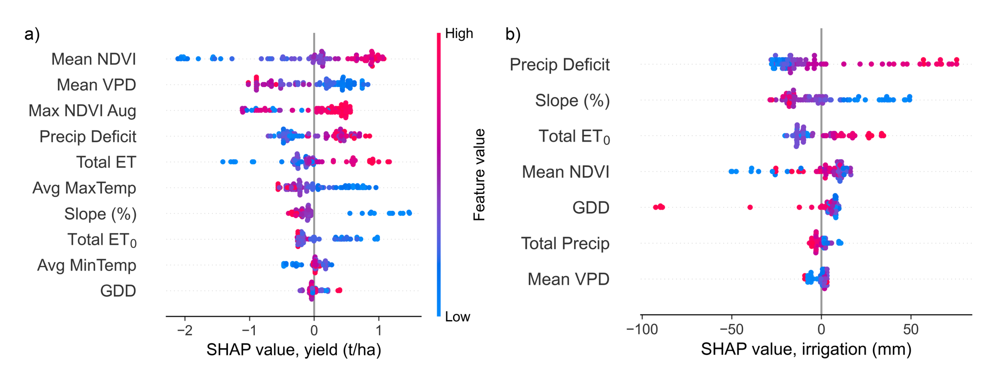

Saved: shp_merged.png


In [5]:

merge_images(
   image_paths="other_2figs",
    filenames=["shp_yld.png", "shp_irrig.png"],
    output_name="shp_merged.png",
    rows=1,
    cols=2,
    dpi =500
#      label_background= "black"

)



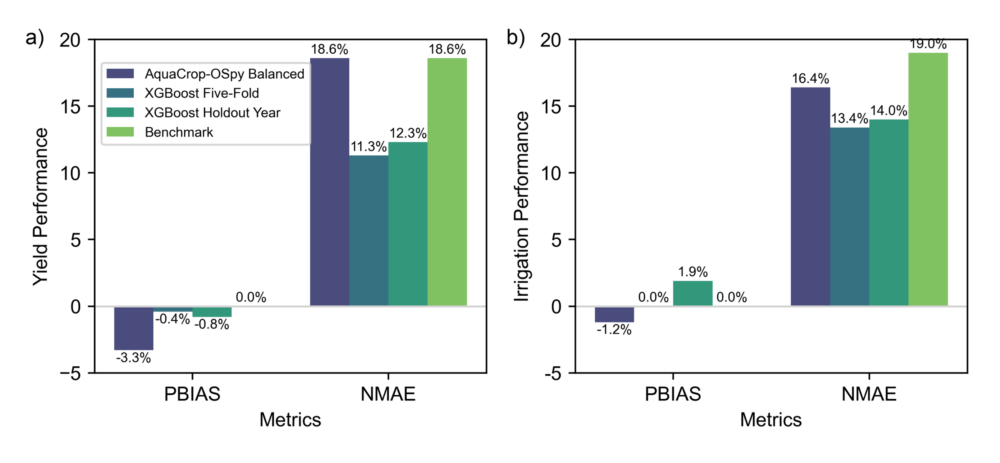

Saved: comp_merged.png


In [36]:
merge_images(
   image_paths="other_2figs",
    filenames=["yld_comp.png", "irrig_comp.png"],
    output_name="comp_merged.png",
    rows=1,
    cols=2,
    dpi =500


)

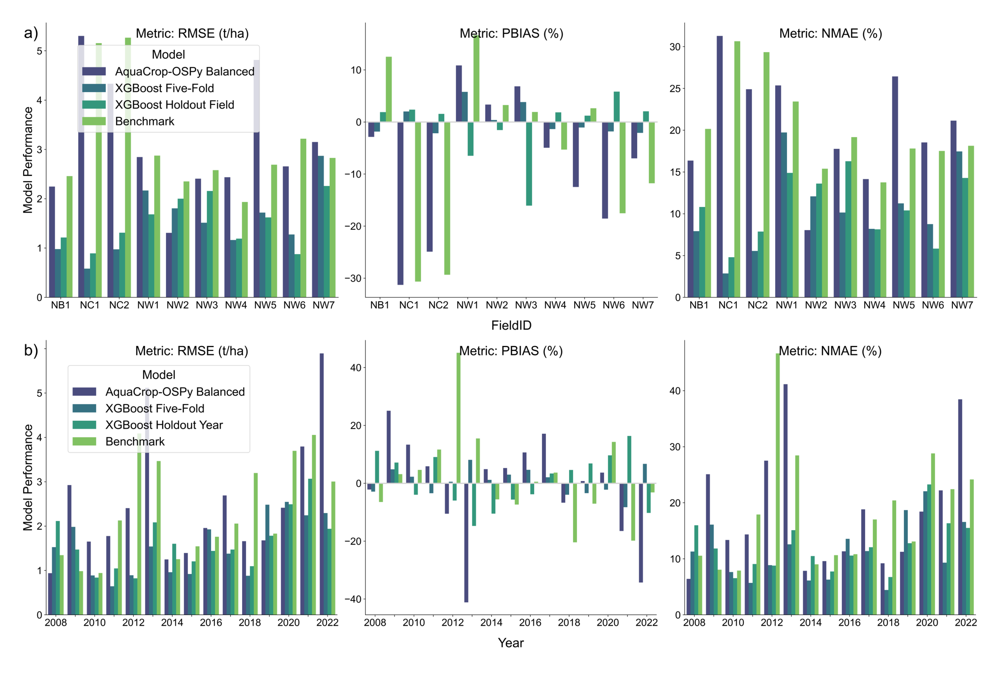

Saved: yld_sptemp_merged.png


In [37]:
merge_images(
   image_paths="other_2figs",
    filenames=["yld_spatio.png", "yld_temp.png"],
    output_name="yld_sptemp_merged.png",
    rows=2,
    cols=1,
    dpi =500


)

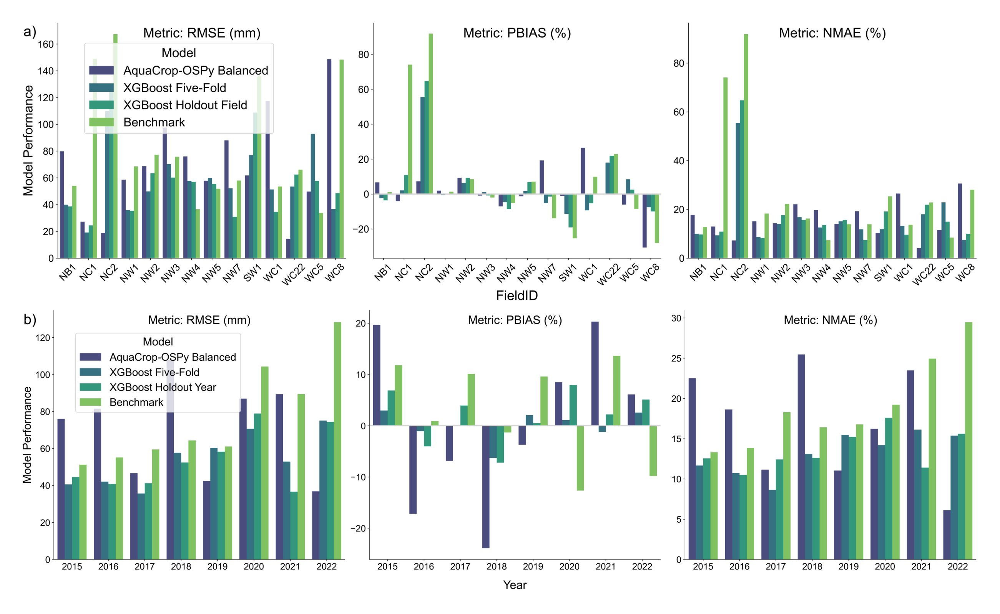

Saved: irrig_sptemp_merged.png


In [38]:
merge_images(
   image_paths="other_2figs",
    filenames=["irrig_spatio.png", "irrig_temp.png"],
    output_name="irrig_sptemp_merged.png",
    rows=2,
    cols=1,
    dpi =500


)

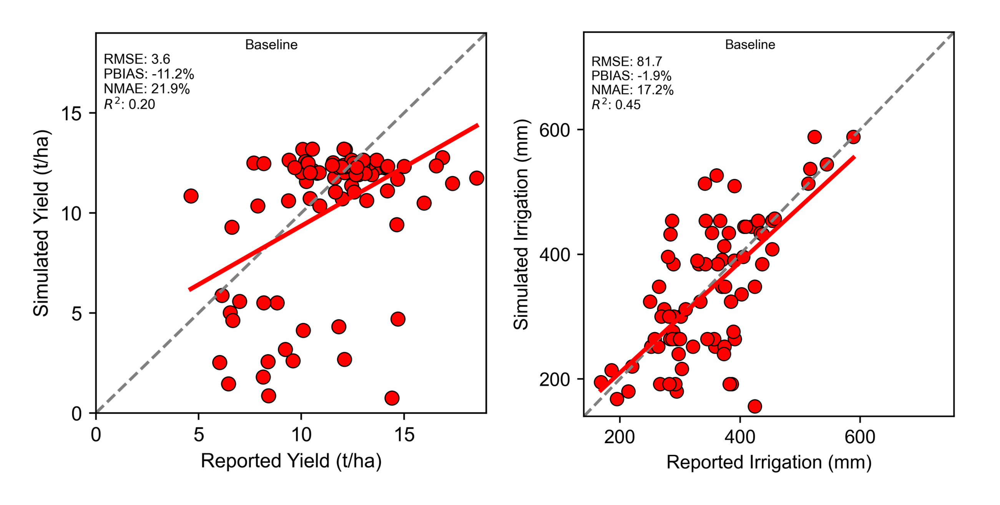

Saved: base_merged.png


In [6]:
merge_images(
   image_paths="other_2figs",
    filenames=["base_yld.png", "base_irrig.png"],
    output_name="base_merged.png",
    rows=1,
    cols=2,
    dpi =500,
    add_labels=False


)